In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def detect_background_color(img, samples_per_edge=100):
    """
    Safely detect the background color by analyzing image edges.
    Uses a more robust sampling approach that avoids zero-step slicing.
    
    Args:
        img: Input image in BGR format
        samples_per_edge: Number of samples to take from each edge
        
    Returns:
        tuple: RGB color values of detected background
    """
    height, width = img.shape[:2]
    
    # Ensure we take at least one sample per edge
    samples_per_edge = max(1, min(samples_per_edge, min(height, width)))
    
    # Calculate step sizes (ensure non-zero)
    width_step = max(1, width // samples_per_edge)
    height_step = max(1, height // samples_per_edge)
    
    # Sample pixels from edges
    edge_pixels = []
    
    # Sample top and bottom edges
    for x in range(0, width, width_step):
        edge_pixels.append(img[0, x])        # Top edge
        edge_pixels.append(img[-1, x])       # Bottom edge
    
    # Sample left and right edges
    for y in range(0, height, height_step):
        edge_pixels.append(img[y, 0])        # Left edge
        edge_pixels.append(img[y, -1])       # Right edge
    
    # Convert to numpy array
    edge_pixels = np.array(edge_pixels)
    
    # Use K-means clustering to find dominant color
    kmeans = KMeans(n_clusters=3, n_init=10)
    kmeans.fit(edge_pixels)
    
    # Get the most frequent color cluster
    unique, counts = np.unique(kmeans.labels_, return_counts=True)
    dominant_cluster = unique[np.argmax(counts)]
    background_color = kmeans.cluster_centers_[dominant_cluster].astype(int)
    
    # Convert from BGR to RGB
    return tuple(background_color[::-1])

def detect_shadows_enhanced(img, background_color):
    """
    Enhanced shadow detection that preserves subtle lighting transitions and reflections.
    This function analyzes both global and local lighting patterns to identify shadows
    while being careful not to misclassify object details as shadows.
    
    Args:
        img: Input image in BGR format
        background_color: RGB tuple of the background color
    Returns:
        numpy.ndarray: Shadow mask where 1 indicates shadow pixels
    """
    # First, convert background color from RGB to BGR for OpenCV
    bg_color = background_color[::-1]
    
    # Create a background image matching our detected background color
    background = np.full_like(img, bg_color)
    
    # Convert both images to LAB color space for better lighting analysis
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    bg_lab = cv2.cvtColor(background, cv2.COLOR_BGR2LAB)
    
    # Extract L (lightness) channels
    l_img = lab[:,:,0].astype(np.float32)
    l_bg = bg_lab[:,:,0].astype(np.float32)
    
    # Calculate local average of lightness using multiple scales
    shadow_masks = []
    for kernel_size in [(21, 21), (41, 41)]:  # Multiple scales for different shadow sizes
        # Calculate local lightness average
        local_mean = cv2.GaussianBlur(l_img, kernel_size, 0)
        
        # Calculate lightness difference from background
        l_diff = np.abs(l_img - l_bg)
        local_diff = np.abs(local_mean - l_bg)
        
        # Create adaptive threshold based on local contrast
        threshold = np.mean(l_diff) * 0.5 + local_diff * 0.2
        
        # Identify shadow regions
        shadow = (l_diff < threshold) & (l_img < l_bg)
        shadow_masks.append(shadow)
    
    # Combine shadow masks from different scales
    shadow_mask = np.logical_or.reduce(shadow_masks)
    
    # Analyze color differences to prevent misclassifying colored regions as shadows
    a_diff = np.abs(lab[:,:,1] - bg_lab[:,:,1])
    b_diff = np.abs(lab[:,:,2] - bg_lab[:,:,2])
    color_diff = np.sqrt(a_diff**2 + b_diff**2)
    
    # Only keep shadow pixels where color difference is small
    shadow_mask &= (color_diff < 30)
    
    # Clean up the mask
    kernel = np.ones((3,3), np.uint8)
    shadow_mask = cv2.morphologyEx(shadow_mask.astype(np.uint8), 
                                 cv2.MORPH_CLOSE, kernel)
    shadow_mask = cv2.morphologyEx(shadow_mask.astype(np.uint8), 
                                 cv2.MORPH_OPEN, kernel)
    
    return shadow_mask

def refined_background_removal(image_input, background_color=None, edge_smoothing=5, preserve_whites=True):
    """
    Advanced background removal with automatic background color detection and
    improved edge handling.
    
    Args:
        image_path: Path to input image
        background_color: RGB tuple or None for auto-detection
        edge_smoothing: Amount of edge smoothing (higher = smoother)
        preserve_whites: Whether to preserve white colors in the object
    """
    def create_color_range_mask(img, target_color, tolerance=20):  # Reduced tolerance
        """Create a more precise mask for colors within tolerance of target color"""
        target_bgr = target_color[::-1]

        # Convert to LAB color space for better color similarity matching
        lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        lab_target = cv2.cvtColor(np.uint8([[target_bgr]]), cv2.COLOR_BGR2LAB)[0,0]

        # Create bounds with tolerance in LAB space
        lower_bound = np.array([max(0, c - tolerance) for c in lab_target])
        upper_bound = np.array([min(255, c + tolerance) for c in lab_target])

        # Create mask in LAB space
        mask = cv2.inRange(lab_image, lower_bound, upper_bound)

        # Clean up the mask
        kernel = np.ones((3,3), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

        return mask

    def smooth_edges(mask, smooth_factor):
        """Apply edge smoothing with outline removal"""
        # Convert to float
        mask_float = mask.astype(np.float32) / 255.0
        
        # Apply erosion first to remove thin outlines
        kernel = np.ones((2,2), np.uint8)
        eroded = cv2.erode(mask_float, kernel, iterations=1)
        
        # Multi-scale smoothing
        smoothed = np.zeros_like(mask_float)
        weights_sum = 0
        
        for i in range(1, 4):
            kernel_size = smooth_factor * 2 * i + 1
            current_smooth = cv2.GaussianBlur(eroded, 
                                            (kernel_size, kernel_size), 
                                            0)
            weight = 1.0 / i
            smoothed += current_smooth * weight
            weights_sum += weight
        
        smoothed /= weights_sum
        
        # Threshold the result to make edges cleaner
        smoothed = np.where(smoothed > 0.5, 1.0, 0.0)
        
        return (smoothed * 255).astype(np.uint8)

    def preserve_white_details(img, mask, threshold=250):  # Increased threshold
        """Preserve white details with stricter thresholds"""
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Create more strict adaptive threshold
        local_mean = cv2.GaussianBlur(gray, (15, 15), 0)
        local_threshold = threshold - (255 - local_mean) * 0.05  # Reduced influence of local mean
        white_areas = gray > local_threshold
        
        # Reduce connectivity to main object
        kernel = np.ones((2,2), np.uint8)  # Smaller kernel
        dilated_mask = cv2.dilate(mask, kernel, iterations=1)  # Fewer iterations
        preserved_whites = white_areas & dilated_mask
        
        # Clean up artifacts
        preserved_whites = cv2.morphologyEx(preserved_whites.astype(np.uint8), 
                                        cv2.MORPH_OPEN, kernel)  # Use OPEN first
        preserved_whites = cv2.morphologyEx(preserved_whites, 
                                        cv2.MORPH_CLOSE, kernel)
        
        return mask | preserved_whites

    def shrink_mask(mask, shrink_percent=1):
        """
        Shrink the mask by a percentage of its dimensions
        Args:
            mask: Binary mask
            shrink_percent: Percentage to shrink (1 = 1%)
        Returns:
            Shrunk mask
        """
        # Get mask dimensions
        height, width = mask.shape[:2]
        
        # Calculate pixels to shrink on each side
        shrink_pixels_y = int(height * (shrink_percent / 100))
        shrink_pixels_x = int(width * (shrink_percent / 100))
        
        # Ensure at least 1 pixel if percentage is too small
        shrink_pixels_y = max(1, shrink_pixels_y)
        shrink_pixels_x = max(1, shrink_pixels_x)
        
        # Create structuring element for erosion
        kernel = cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (2 * shrink_pixels_x + 1, 2 * shrink_pixels_y + 1)
        )
        
        # Erode the mask
        shrunk_mask = cv2.erode(mask, kernel, iterations=1)
        
        return shrunk_mask

    # Main processing pipeline
    try:
        print("Loading image...")
        # Input validation and conversion
        if isinstance(image_input, str):
            print("It's a file path - load the image")
            if not os.path.exists(image_input):
                raise ValueError(f"Image file not found: {image_input}")
            image = cv2.imread(image_input)
            if image is None:
                raise ValueError(f"Failed to load image from {image_input}")
        elif isinstance(image_input, np.ndarray):
            print("It's already a numpy array - verify format")
            if len(image_input.shape) != 3 or image_input.shape[2] != 3:
                raise ValueError("Image array must be a 3-channel color image")
            image = image_input
        elif isinstance(image_input, Image.Image):
            
            print("Convert PIL Image to numpy array in BGR format")
            image_array = np.array(image_input)
            image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
        else:
            raise TypeError("Image input must be either a file path, numpy array, or PIL Image")
        
        # Handle background color detection
        if background_color is None:
            print("Detecting background color...")
            detected_color = detect_background_color(image)
            print(f"Detected background color (RGB): {detected_color}")
            bg_color = detected_color
        else:
            bg_color = background_color
        
        print("Detecting shadows...")
        shadow_mask = detect_shadows_enhanced(image, bg_color)
        
        print("Creating color-based mask...")
        color_mask = create_color_range_mask(image, bg_color)
        
        # Combine color and shadow masks
        combined_mask = (color_mask | shadow_mask)

        
        
        # Invert mask (we want to keep the object, not the background)
        object_mask = cv2.bitwise_not(combined_mask)
        
        # Preserve white details if requested
        if preserve_whites:
            print("Preserving white details...")
            object_mask = preserve_white_details(image, object_mask)

        
        # Apply edge smoothing
        if edge_smoothing > 0:
            print("Smoothing edges...")
            object_mask = smooth_edges(object_mask, edge_smoothing)

        # Shrinking mask
        print("Shrinking mask...")
        object_mask = shrink_mask(object_mask, shrink_percent=0.5)
        
        
        # Create output images
        alpha = object_mask
        rgba = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
        rgba[:, :, 3] = alpha
        
        result = image.copy()
        result[alpha == 0] = [0, 0, 0]
        
        # Convert to RGB for display
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
        
        # Enhanced visualization to show shadow detection
        plt.figure(figsize=(20, 3))
        
        plt.subplot(151)
        plt.imshow(image_rgb)
        plt.title('Original Image')
        plt.axis('off')
        
        plt.subplot(152)
        plt.imshow(shadow_mask, cmap='gray')
        plt.title('Shadow Mask')
        plt.axis('off')
        
        plt.subplot(153)
        plt.imshow(object_mask, cmap='gray')
        plt.title('Final Mask')
        plt.axis('off')
        
        plt.subplot(154)
        plt.imshow(result_rgb)
        plt.title('Result (Black Background)')
        plt.axis('off')
        
        # Display with checkered background
        plt.subplot(155)
        checkered = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)
        checkered[::20, ::20] = [200, 200, 200]
        checkered[10::20, 10::20] = [200, 200, 200]
        
        alpha_3d = alpha[:,:,np.newaxis] / 255.0
        blended = (image_rgb * alpha_3d + checkered * (1 - alpha_3d)).astype(np.uint8)
        plt.imshow(blended)
        plt.title('Result (Transparent)')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()


        plt.imshow(result_rgb)
        plt.title('Result (Transparent)')
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        
        return image_rgb, alpha, result_rgb, blended, rgba
    
    except Exception as e:
        print(f"Error during processing: {str(e)}")
        return None

# Example usage:
if __name__ == "__main__":
    try:
        results = refined_background_removal(
            "../static/uploads/Chair/front.jpg",
            background_color=None,  # Enable auto-detection
            edge_smoothing=5,
            preserve_whites=True
        )
    except Exception as e:
        print(f"Failed to process image: {str(e)}")

Loading image...
It's a file path - load the image
Error during processing: name 'os' is not defined



Loading and normalizing images...
Front view original size: 750x422
Back view original size: 750x422
Top view original size: 750x422

Target size determined: 416x416
Front view normalized size: 416x416
Back view normalized size: 416x416
Top view normalized size: 416x416

All images successfully normalized to size: 416
Loading image...
It's already a numpy array - verify format
Detecting background color...
Detected background color (RGB): (255, 255, 255)
Detecting shadows...
Creating color-based mask...
Preserving white details...
Smoothing edges...
Shrinking mask...


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1474: ConvergenceWarning:

Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.



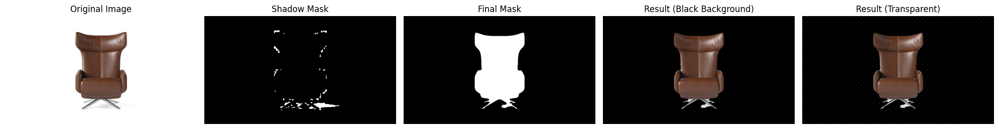

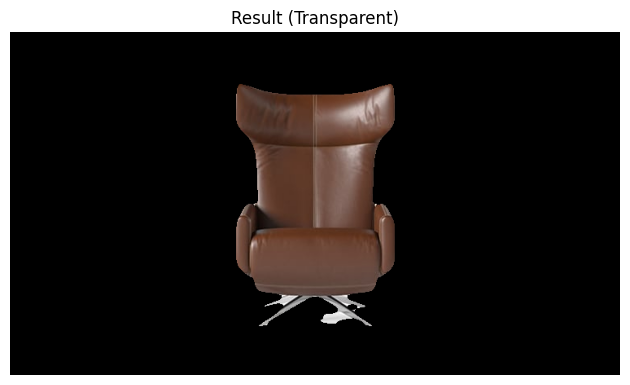

Loading image...
It's already a numpy array - verify format
Detecting background color...
Detected background color (RGB): (255, 255, 255)
Detecting shadows...
Creating color-based mask...
Preserving white details...
Smoothing edges...
Shrinking mask...


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1474: ConvergenceWarning:

Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.



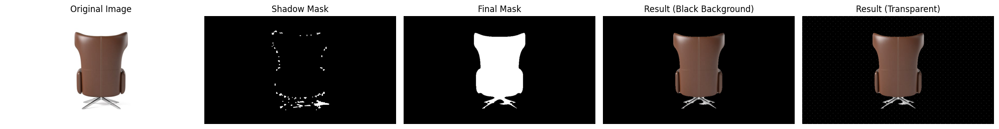

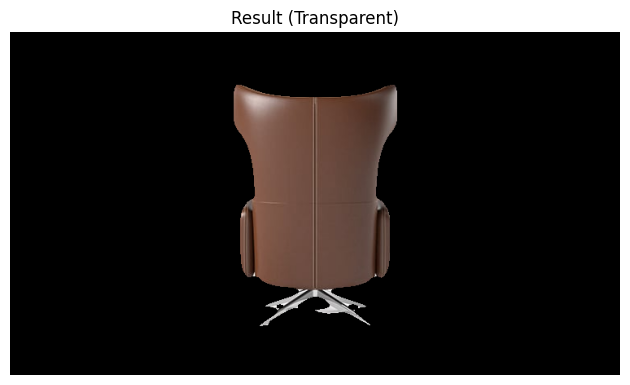

origina width:  126 original_height:  95


{'data': [{'marker': {'color': ['rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(85,45,24)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(33,19,14)',
     'rgb(50,29,21)',
     'rgb(50,29,21)',
     'rgb(50,29,21)',
     'rgb(50,29,21)',
     

In [20]:
import torch
import os
import cv2
import numpy as np
from PIL import Image
import plotly.graph_objects as go
from transformers import pipeline
# from models.refined_background_removal import refined_background_removal

def load_and_normalize_images(image_paths):
    """
    Load and normalize all images to the same size while maintaining aspect ratios.
    We first determine the target size based on the smallest image dimension,
    then resize all images accordingly with proper padding.
    """
    print("\nLoading and normalizing images...")
    
    # First, load all images and get their dimensions
    images = {}
    dimensions = []
    for view_type, path in image_paths.items():
        img = cv2.imread(path)
        if img is None:
            raise ValueError(f"Failed to load image: {path}")
        images[view_type] = img
        dimensions.append(img.shape[:2])
        print(f"{view_type.capitalize()} view original size: {img.shape[1]}x{img.shape[0]}")
    
    # Find the smallest dimension across all images
    min_dim = min(min(dim) for dim in dimensions)
    # Round to nearest multiple of 32 (common requirement for deep learning models)
    target_size = ((min_dim // 32) * 32)
    print(f"\nTarget size determined: {target_size}x{target_size}")
    
    normalized_images = {}
    for view_type, img in images.items():
        # Calculate aspect ratio preserving dimensions
        h, w = img.shape[:2]
        aspect = w / h
        
        if aspect > 1:
            new_w = target_size
            new_h = int(target_size / aspect)
        else:
            new_h = target_size
            new_w = int(target_size * aspect)
            
        # Resize image
        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
        
        # Create square canvas with padding
        square_img = np.zeros((target_size, target_size, 3), dtype=np.uint8)
        
        # Calculate padding to center the image
        pad_y = (target_size - new_h) // 2
        pad_x = (target_size - new_w) // 2
        
        # Place resized image in center
        square_img[pad_y:pad_y+new_h, pad_x:pad_x+new_w] = resized
        
        normalized_images[view_type] = square_img
        print(f"{view_type.capitalize()} view normalized size: {square_img.shape[1]}x{square_img.shape[0]}")
    
    return normalized_images, target_size

def create_object_mesh(image_input, depth_threshold=0.75):
    """
    Creates a 3D mesh from either an image path or a numpy array using refined background removal.
    The function works directly with image data without saving temporary files.
    
    Args:
        image_input: Can be either a file path (str), PIL Image, or a numpy array
        depth_threshold: Threshold for depth filtering (0.0 to 1.0)
    """
    # Input validation and conversion
    if isinstance(image_input, str):
        # It's a file path - load the image
        if not os.path.exists(image_input):
            raise ValueError(f"Image file not found: {image_input}")
        image = cv2.imread(image_input)
        if image is None:
            raise ValueError(f"Failed to load image from {image_input}")
    elif isinstance(image_input, np.ndarray):
        # It's already a numpy array - verify format
        if len(image_input.shape) != 3 or image_input.shape[2] != 3:
            raise ValueError("Image array must be a 3-channel color image")
        image = image_input
    elif isinstance(image_input, Image.Image):
        # Convert PIL Image to numpy array in BGR format
        image_array = np.array(image_input)
        image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
    else:
        raise TypeError("Image input must be either a file path, numpy array, or PIL Image")

    try:
        # Apply refined background removal directly to the image
        # Note: refined_background_removal expects BGR input and returns RGB output
        _, alpha_mask, result_rgb, _, _ = refined_background_removal(image)
        
        # Get depth map using Depth Anything model
        device = "cuda" if torch.cuda.is_available() else "cpu"
        depth_model = pipeline("depth-estimation", model="depth-anything/Depth-Anything-V2-base-hf", device=device)
        
        # Use result_rgb directly for depth estimation (it's already in RGB format)
        image_pil = Image.fromarray(result_rgb)
        depth_predictions = depth_model(image_pil)
        depth_map = np.array(depth_predictions["depth"])
        
        # Process depth map with dimensions from result_rgb
        height, width = result_rgb.shape[:2]
        depth_map_resized = cv2.resize(depth_map, (width, height))
        
        # Apply alpha mask to depth map
        alpha_mask_resized = cv2.resize(alpha_mask, (depth_map_resized.shape[1], depth_map_resized.shape[0]))

        # depth_mask = alpha_mask_resized > 0
        # depth_edges = np.zeros_like(depth_map_resized)
        # depth_edges[depth_mask] = depth_map_resized[depth_mask]
        # depth_edges_smoothed = cv2.GaussianBlur(depth_edges, (5, 5), 0)
        
        return create_clean_scatter_visualization(depth_map, result_rgb, "create_clean_scatter_visualization")
        
    except Exception as e:
        print(f"Error during mesh creation: {str(e)}")
        return None
    
def create_clean_scatter_visualization(depth_map, image, title, target_size=200):
    """
    Creates a clean 3D scatter visualization with continuous points extending to the ground.
    This version removes shadows, opacity effects, and camera restrictions for a clearer view.
    """
    # First, let's normalize our dimensions to prevent memory issues
    height, width = depth_map.shape
    scale_factor = target_size / max(width, height)
    
    # Scale our dimensions while maintaining proportions
    new_width = int(width * scale_factor)
    new_height = int(height * scale_factor)
    
    # Resize our depth map and image to the new dimensions
    depth_norm = cv2.resize(depth_map, (new_width, new_height))
    image_resized = cv2.resize(image, (new_width, new_height))
    
    # Create a mask to identify the actual object (non-background)
    valid_mask = ~np.all(image_resized == 0, axis=2)
    
    # Normalize depth values to our target size
    depth_norm = depth_norm / depth_norm.max() * target_size
    
    # Create our coordinate system
    x_coords, y_coords = np.meshgrid(np.arange(new_width), np.arange(new_height))
    
    # Initialize lists to store all our points
    x_all = []
    y_all = []
    z_all = []
    colors_all = []
    
    # We'll create 20 points in each vertical line for smooth continuation
    num_vertical_points = 20
    
    # Process each valid point in our image
    for i in range(new_height):
        for j in range(new_width):
            if valid_mask[i, j]:
                # Get the height of our current point
                original_depth = depth_norm[i, j]
                
                # Create a line of points from the original height down to the ground
                z_points = np.linspace(original_depth, 0, num_vertical_points)
                
                # Add these points to our collections
                x_all.extend([j] * num_vertical_points)
                y_all.extend([i] * num_vertical_points)
                z_all.extend(z_points)
                
                # Use the original color for all points in this line
                # This creates a solid color effect without fading
                original_color = image_resized[i, j]
                colors_all.extend([original_color] * num_vertical_points)
    
    # Convert our lists to numpy arrays for efficiency
    x_all = np.array(x_all)
    y_all = np.array(y_all)
    z_all = np.array(z_all)
    colors_all = np.array(colors_all)
    
    # Create color strings for plotting
    color_strings = [f'rgb({r},{g},{b})' for r,g,b in colors_all]
    
    # Create our figure with clean, simple settings
    fig = go.Figure(data=[go.Scatter3d(
        x=x_all,
        y=y_all,
        z=z_all,
        mode='markers',
        marker=dict(
            size=2,
            color=color_strings,
            opacity=1.0  # Full opacity for clear visualization
        )
    )])
    
    # Set up a clean layout without restrictive camera angles
    fig.update_layout(
        title=dict(
            text=title,
            x=0.5,
            y=0.95,
            xanchor='center',
            yanchor='top',
            font=dict(size=20)
        ),
        scene=dict(
            # Remove camera restrictions to allow free movement
            xaxis=dict(
                range=[0, new_width],
                nticks=10,
                title='Width',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            ),
            yaxis=dict(
                range=[0, new_height],
                nticks=10,
                title='Height',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            ),
            zaxis=dict(
                range=[0, target_size],
                nticks=10,
                title='Depth',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            )
        ),
        width=800,
        height=800,
        showlegend=False,
        paper_bgcolor='white'
    )
    
    return fig

def combine_front_back_meshes(front_fig, back_fig, depth_threshold=0.25, sampling_rate=0.5):
    """
    Creates an optimized 3D visualization combining front and back mesh views.
    
    Args:
        front_fig: Plotly figure of front mesh
        back_fig: Plotly figure of back mesh
        depth_threshold: Depth threshold value
        sampling_rate: Fraction of points to keep (0.0 to 1.0)
    """
    def extract_points(fig):
        if fig is None or not fig.data:
            return [], [], [], []
        trace = fig.data[0]
        return (
            np.array(trace.x), 
            np.array(trace.y), 
            np.array(trace.z), 
            [c.strip('rgb()').split(',') for c in trace.marker.color]
        )
    
    def sample_points(x, y, z, colors, rate):
        """Efficiently sample points using numpy"""
        n_points = len(x)
        n_sample = int(n_points * rate)
        if n_sample >= n_points:
            return x, y, z, colors
        
        # Use numpy's random choice for efficient sampling
        indices = np.random.choice(n_points, n_sample, replace=False)
        indices.sort()  # Sort for better memory access patterns
        
        return (x[indices], y[indices], z[indices],
                [colors[i] for i in indices])
    
    # Extract points and convert to numpy arrays for faster processing
    front_x, front_y, front_z, front_colors = extract_points(front_fig)
    back_x, back_y, back_z, back_colors = extract_points(back_fig)
    
    # # Sample points if needed
    # front_x, front_y, front_z, front_colors = sample_points(
    #     front_x, front_y, front_z, front_colors, sampling_rate)
    # back_x, back_y, back_z, back_colors = sample_points(
    #     back_x, back_y, back_z, back_colors, sampling_rate)
    
    # Calculate dimensions using numpy operations
    original_width = max(np.max(front_x), np.max(back_x))
    original_height = max(np.max(front_y), np.max(back_y))

    print("origina width: ",original_width,  "original_height: ", original_height)
    aspect_ratio = original_width / original_height
    
    # Center views using vectorized operations
    front_width = np.max(front_x) - np.min(front_x)
    back_width = np.max(back_x) - np.min(back_x)
    
    front_x_centered = front_x - np.min(front_x) - front_width/2
    back_x_centered = -(back_x - np.min(back_x) - back_width/2)

    front_y_centered = front_y - np.min(front_y) - front_width/2
    back_y_centered = -(back_y - np.min(back_y) - back_width/2)
    
    # Normalize z-coordinates using vectorized operations
    front_z_norm = 0.5 + (front_z - np.min(front_z)) * depth_threshold / (np.max(front_z) - np.min(front_z))
    back_z_norm = 0.5 - (back_z - np.min(back_z)) * depth_threshold / (np.max(back_z) - np.min(back_z))
    
    # Convert colors to RGB strings efficiently
    def process_colors(colors):
        return [f'rgb({",".join(c)})' for c in colors]
    
    front_colors_processed = process_colors(front_colors)
    back_colors_processed = process_colors(back_colors)
    
    # Combine points using numpy concatenation
    combined_x = np.concatenate([front_x_centered, back_x_centered])
    combined_y = np.concatenate([front_y, back_y])
    combined_z = np.concatenate([front_z_norm, back_z_norm])
    combined_colors = front_colors_processed + back_colors_processed
    
    # Create the figure
    combined_fig = go.Figure(data=[go.Scatter3d(
        x=combined_x,
        y=combined_y,
        z=combined_z,
        mode='markers',
        marker=dict(
            size=2,
            color=combined_colors,
            opacity=1
        ),
        showlegend=False
    )])
    
    # Update layout with minimal settings
    combined_fig.update_layout(
        scene=dict(
            aspectratio=dict(x=1, y=1/aspect_ratio, z=0.5),
            aspectmode='manual',
            camera=dict(
                eye=dict(x=1.25, y=-0.25, z=1.25),
                up=dict(x=0, y=0, z=0),
                center=dict(x=0, y=0, z=0)
            ),
            xaxis=dict(
                range=[-original_width/2, original_width/2],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            ),
            yaxis=dict(
                range=[0, original_height],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            ),
            zaxis=dict(
                range=[0, 1],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            )
        ),
        uirevision='true',
        showlegend=False,
        margin=dict(l=0, r=0, t=0, b=0, pad=0),
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)'
    )
    
    return combined_fig



def process_orthogonal_views(front, back=None, top=None, depth_threshold=0.0, sampling_rate=1.0):
    # Process all three views
    image_paths = {
        'front': f"{front}",
        'back': f"{back}",
        'top': f"{top}"
    }

    # First normalize all images
    try:
        normalized_images, target_size = load_and_normalize_images(image_paths)
        print("\nAll images successfully normalized to size:", target_size)

        # First, let's get our three normalized meshes individually
        front_fig = create_object_mesh(image_paths['front'], depth_threshold=depth_threshold)
        back_fig = create_object_mesh(image_paths['back'], depth_threshold=depth_threshold)
        # top_fig = create_object_mesh(image_paths['top'], depth_threshold=depth_threshold)

         # For maximum quality (but slower)
        combined_mesh = combine_front_back_meshes(front_fig, back_fig, sampling_rate=sampling_rate)
        combined_mesh.show()
        return combined_mesh.to_dict()
    
    except Exception as e:
        print(f"Error during image normalization: {str(e)}")
        return None



# for single image
def process_image(image_path, depth_threshold=0.0):
    # First normalize all images
    image_paths = {
        'front': f"{image_path}"
    }
    try:
        normalized_images, target_size = load_and_normalize_images(image_paths)
        print("\nAll images successfully normalized to size:", target_size)

        # First, let's get our three normalized meshes individually
        front_fig = create_object_mesh(image_paths['front'], depth_threshold=depth_threshold)

        if front_fig is not None:
            front_fig.update_layout(
                title=dict(
                    text=f"3D Mesh - front View (Size: {target_size}x{target_size})",
                    y=0.95
                )
            )
            front_fig.show()
        else:
            print(f"Failed to create mesh for front view")
    except Exception as e:
        print(f"Error during image normalization: {str(e)}")

    # Convert the Plotly figure to JSON-serializable format
    # return front_fig.to_dict()  # This converts the Plotly figure to a dictionary


process_orthogonal_views("../static/uploads/Chair/front.jpg", "../static/uploads/Chair/back.jpg", "../static/uploads/Chair/front.jpg")